In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
dir_dados = '../2_dados/'
arq_sumario = dir_dados + 'data_sumario.parquet'
arq_serie = dir_dados + '/data_series/data_{}.npy'

### Sumário

In [3]:
df = pd.read_parquet(arq_sumario)

In [4]:
df.shape[0]

501

In [5]:
df.head(6)

,signal_id,phase,target,arquivo
0,0,0,0,1
1,1,1,0,1
2,2,2,0,1
3,3,0,1,2
4,4,1,1,2
5,5,2,1,2


### Série Completa

In [6]:
arq_1 = np.load(arq_serie.format(1))
print('Dimensões das séries:', arq_1.shape)
t = np.arange(arq_1.shape[1])

Dimensões das séries: (3, 800000)


In [7]:
arq_2 = np.load(arq_serie.format(2))

In [8]:
plt.rcParams['figure.figsize'] = (35, 15)

#### Sem Descarga Parcial 

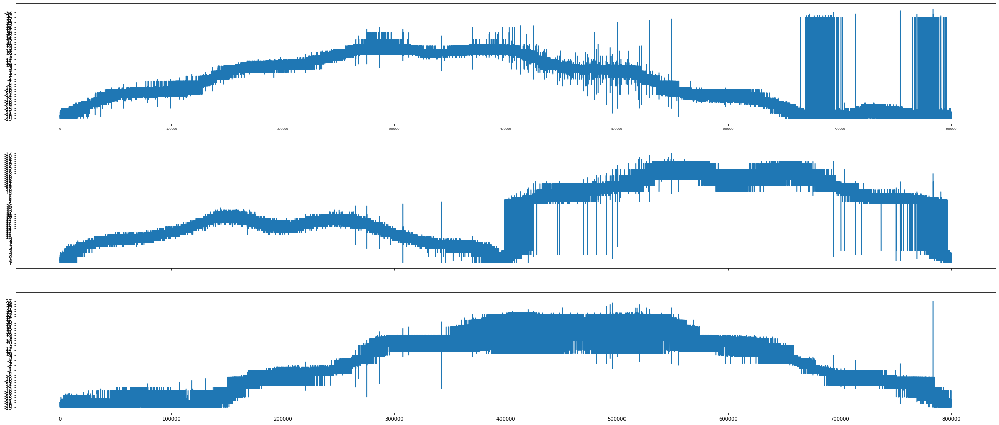

In [9]:
ax1 = plt.subplot(311)
plt.plot(t, arq_1[0])
plt.setp(ax1.get_xticklabels(), fontsize=6)

ax2 = plt.subplot(312, sharex=ax1)
plt.plot(t, arq_1[1])
plt.setp(ax2.get_xticklabels(), visible=False)

ax3 = plt.subplot(313, sharex=ax1, sharey=ax1)
plt.plot(t, arq_1[2])

plt.show()

#### Com Descarga Parcial

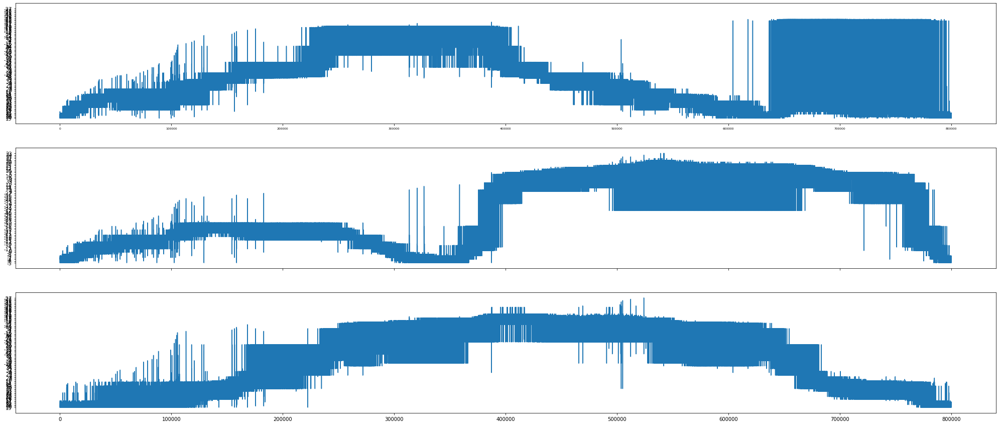

In [10]:
ax1 = plt.subplot(311)
plt.plot(t, arq_2[0])
plt.setp(ax1.get_xticklabels(), fontsize=6)

ax2 = plt.subplot(312, sharex=ax1)
plt.plot(t, arq_2[1])
plt.setp(ax2.get_xticklabels(), visible=False)

ax3 = plt.subplot(313, sharex=ax1, sharey=ax1)
plt.plot(t, arq_2[2])

plt.show()

### Zoom na série

#### Sem Descarga Parcial

In [11]:
ini = 700000
fim = 700250
t1 = t[ini:fim]

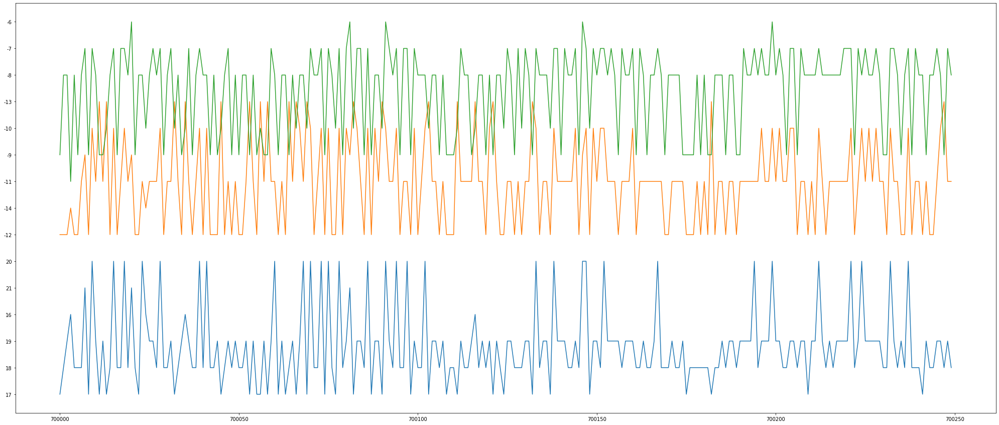

In [12]:
plt.plot(t1, arq_1[0][ini:fim])
plt.plot(t1, arq_1[1][ini:fim])
plt.plot(t1, arq_1[2][ini:fim])
plt.show()

#### Com Descarga Parcial

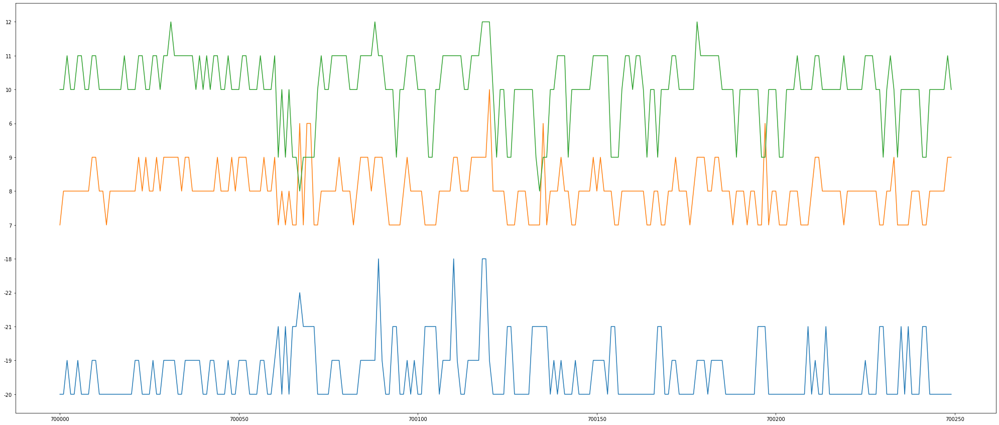

In [13]:
plt.plot(t1, arq_2[0][ini:fim])
plt.plot(t1, arq_2[1][ini:fim])
plt.plot(t1, arq_2[2][ini:fim])
plt.show()

### Target == 1

In [19]:
df[df['target'] == 1]

,signal_id,phase,target,arquivo
3,3,0,1,2
4,4,1,1,2
5,5,2,1,2
201,201,0,1,68
202,202,1,1,68
228,228,0,1,77
229,229,1,1,77
230,230,2,1,77
270,270,0,1,91
271,271,1,1,91


### Mais Séries

#### Sem Descarga Parcial

In [35]:
arq_152 = np.load(arq_serie.format(152))

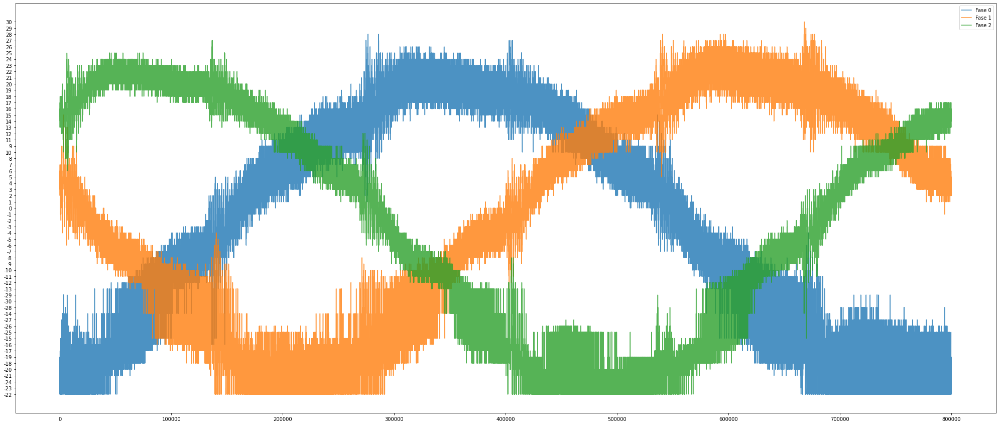

In [46]:
plt.plot(t, arq_152[0], label='Fase 0', alpha=.8)
plt.plot(t, arq_152[1], label='Fase 1', alpha=.8)
plt.plot(t, arq_152[2], label='Fase 2', alpha=.8)
plt.legend()
plt.show()

#### Com Descarga Parcial

In [37]:
arq_99 = np.load(arq_serie.format(99))

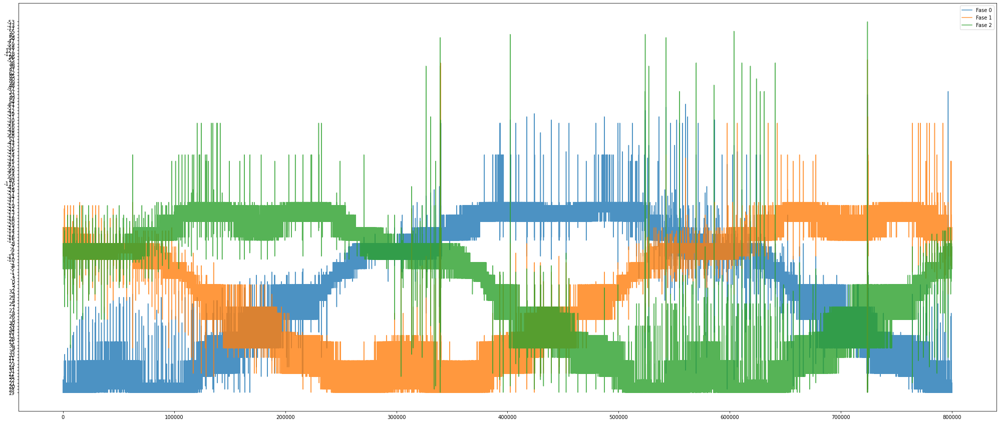

In [45]:
plt.plot(t, arq_99[0], label='Fase 0', alpha=.8)
plt.plot(t, arq_99[1], label='Fase 1', alpha=.8)
plt.plot(t, arq_99[2], label='Fase 2', alpha=.8)
plt.legend()
plt.show()

#### Arq_97 - Somente a fase 2 possui descarga

In [39]:
arq_97 = np.load(arq_serie.format(97))

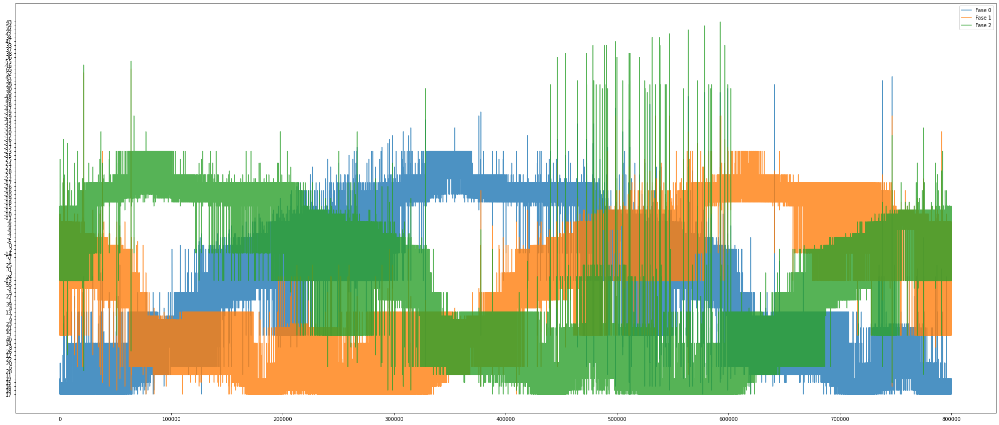

In [44]:
plt.plot(t, arq_97[0], label='Fase 0', alpha=.8)
plt.plot(t, arq_97[1], label='Fase 1', alpha=.8)
plt.plot(t, arq_97[2], label='Fase 2', alpha=.8)
plt.legend()
plt.show()

### Distribuição de Frequência

#### Comparação do histograma da fase 0 de dois exemplos

In [62]:
plt.rcParams['figure.figsize'] = (30, 10)

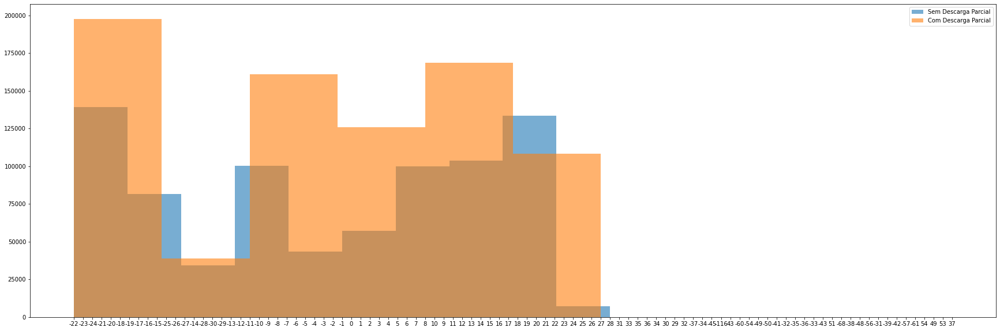

In [63]:
plt.hist(arq_152[0], label='Sem Descarga Parcial', alpha=.6)
plt.hist(arq_99[0], label='Com Descarga Parcial', alpha=.6)
plt.legend()
plt.show() 